Hierarchical Clustering with our photos

In [7]:
from cnns.utils import process_utils as pu
from cnns.utils import img_proc_utils as ipu
from cnns.utils import clustering_utils as clu
from cnns.utils import cnn_utils as cu
import matplotlib
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn import preprocessing
import numpy as np 
import os
import pickle as pkl
from itertools import combinations
import pandas as pd
import datetime
import json
import math

In [2]:
%load_ext autoreload
%autoreload 2

In [50]:
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (16, 8)
np.set_printoptions(precision=5, suppress=True)

In [37]:
base_dir = '/Users/babasarala/Desktop/face_clustering_results'

# Define the 
setting_version = '1.1'
clustering_settings_filename = '/Users/babasarala/repos/cnns/config/face_clustering_settings_v%s.ini'%setting_version
config = cu.parse_settings_file_to_dict(clustering_settings_filename)
#pickled_cnn_codes = '%s/1341/1341_100_25_fc6_cnn_codes.p'%(base_dir)
pickled_cnn_codes = '%s/2685009/2685009_prod_fb_tags_1.1_cnn_codes/VGGFace_fc6_cnn_codes.p'%(base_dir)
img_urls, X = pkl.load(open(pickled_cnn_codes, 'rb'))

Full clustering flow

In [38]:
_, feat_dim = X.shape
cluster_config = config['clustering']

# 1. remove absolute duplicates if necessary
remove_duplicates = cluster_config['remove_duplicates'] == 'True'
if remove_duplicates:
    sorted_idx = np.lexsort(X.T)
    X = X[sorted_idx, :]
    img_ids = [img_urls[idx] for idx in sorted_idx]

# 2. preprocess the feature vectors if necessary
normalize = cluster_config['normalize'] == 'True'
use_pca = cluster_config['use_pca'] == 'True'
num_components = int(cluster_config['num_components'])

if normalize:
    X = preprocessing.normalize(X, norm='l2', axis=0)
if use_pca:
    feat_dim = num_components

In [39]:
from scipy.cluster.hierarchy import dendrogram, linkage

Z = linkage(X, 'ward')

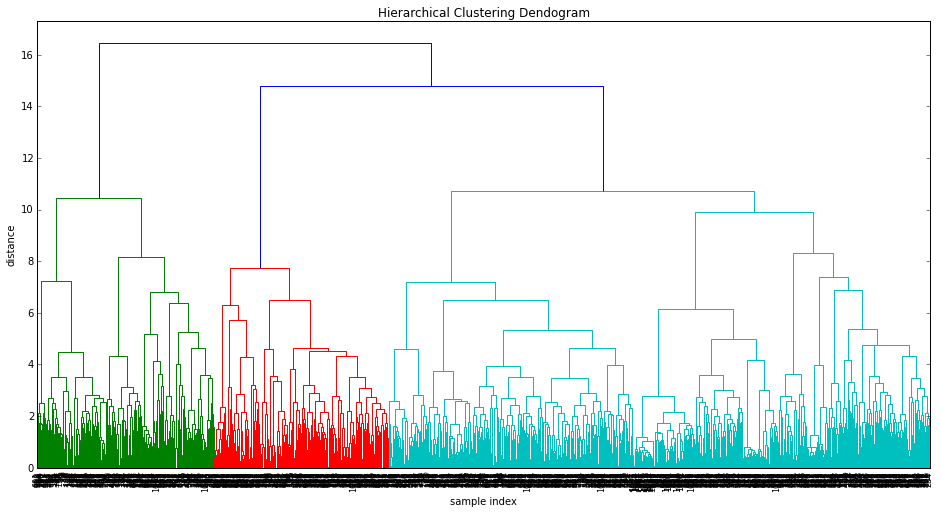

In [40]:
plt.title('Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    Z,
    leaf_rotation=90.,
    leaf_font_size=8.)
plt.show()

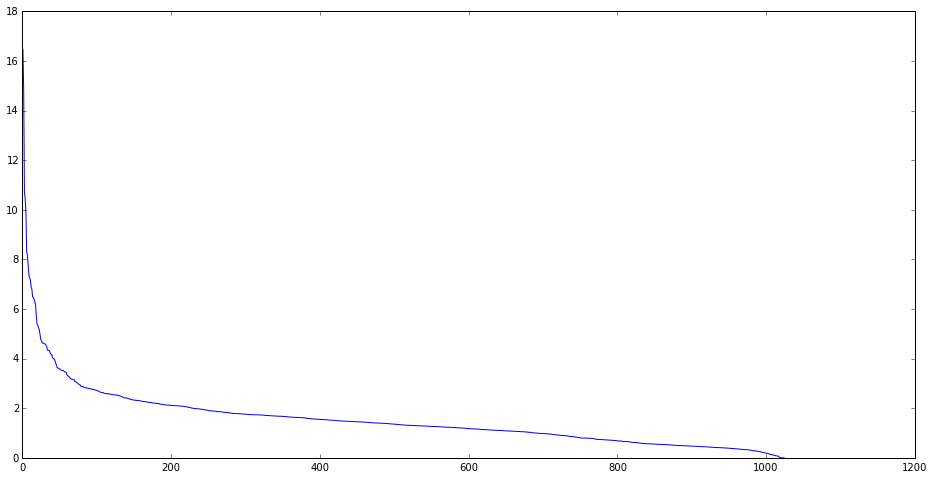

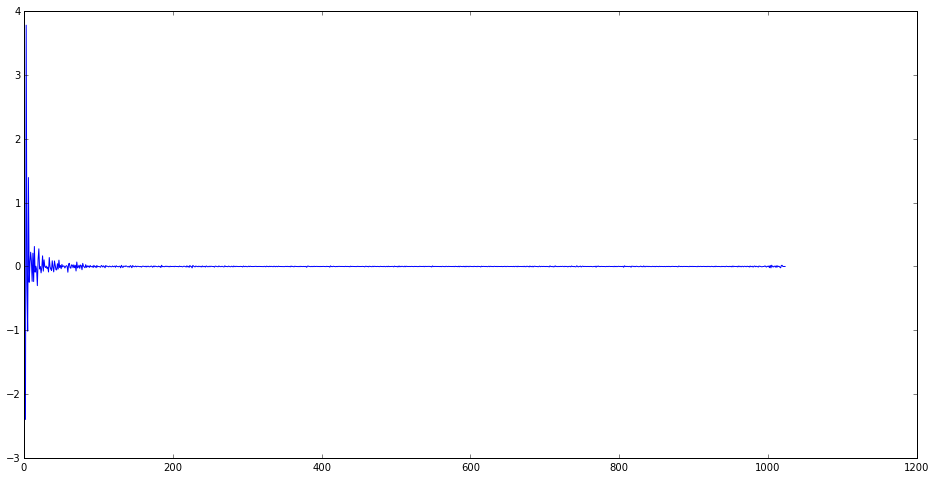

Clusters: 3


In [42]:
last = Z[:, 2]
last_rev = last[::-1]
idxs = np.arange(1, len(last)+1)
plt.plot(idxs, last_rev)
plt.show()

acceleration = np.diff(last, 2) # end derivative of distances
acceleration_rev = acceleration[::-1]
plt.plot(idxs[:-2] + 1, acceleration_rev)
plt.show()
k = acceleration_rev.argmax() + 2
print "Clusters: %i"%k

In [30]:
from scipy.cluster.hierarchy import fcluster
cluster_idxs = fcluster(Z, k, criterion='maxclust')

In [31]:
cluster_idxs

array([3, 3, 3, ..., 3, 3, 3], dtype=int32)

Distribution of distances in a very tight cluster

In [15]:
# Load Johnny's cluster
base_dir = '/Users/babasarala/Desktop'
pkl_filepath = '%s/latest_face_clustering_results/1496616/1496616_prod_fb_tags_1.1_cnn_codes/VGGFace_fc6_cnn_codes.p' % base_dir
config_filepath = '/Users/babasarala/repos/cnns/config/face_clustering_settings_v1.0.ini'
config = cu.parse_settings_file_to_dict(config_filepath)
img_ids, X = pkl.load(open(pkl_filepath, 'rb'))

In [19]:
_, feat_dim = X.shape
cluster_config = config['clustering']
remove_duplicates = cluster_config['remove_duplicates'] == 'True'

if remove_duplicates:
    sorted_idx = np.lexsort(X.T)
    X = X[sorted_idx, :]
    img_ids = [img_ids[idx] for idx in sorted_idx]

normalize = cluster_config['normalize'] == 'True'
use_pca = cluster_config['use_pca'] == 'True'
num_components = int(cluster_config['num_components'])
run_face_detect = cluster_config['run_face_detect'] == 'True'

if normalize:
    # by "normalize"
    # = preprocessing.StandardScaler().fit_transform(X)
    X = preprocessing.normalize(X, norm='l2', axis=0)
if use_pca:
    feat_dim = num_components

if cluster_config['cluster_algo'] == 'single':
    cluster_id_img_url, cluster_ids = clu.cluster_features(
        img_ids, X, use_pca=use_pca, num_components=num_components)

elif cluster_config['cluster_algo'] == 'multi':
    cluster_id_img_url, cluster_ids = clu.multi_cluster_features(img_ids, X,
                                                             use_pca=use_pca,
                                                             num_components=num_components)

cluster_df = clu.convert_to_dataframe(img_ids, X, cluster_ids)

# map data frames to maps
cluster_map = clu.get_map_from_dataframe(
    cluster_df, 'img_url', 'cluster_idx')

clu.visualize_clusters(cluster_map, '/Users/babasarala/Desktop/johnny.html')

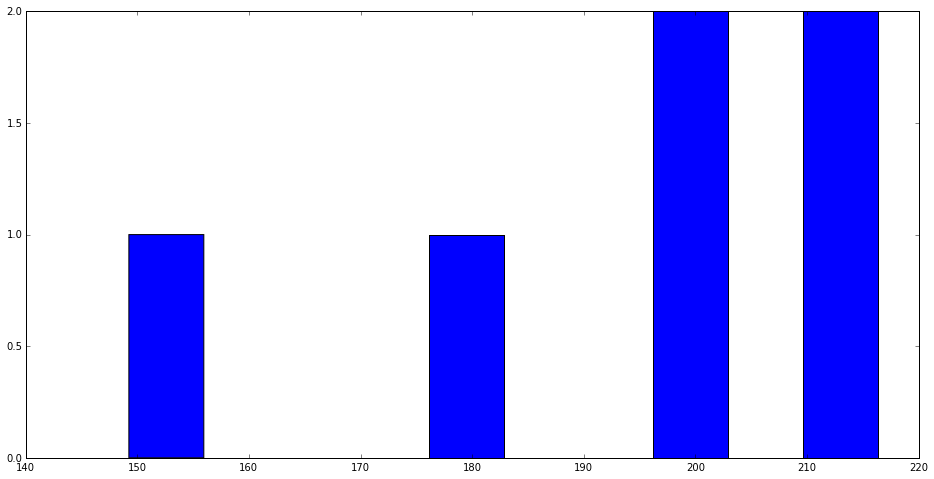

,dists
count,6.000000
mean,192.094843
std,25.646653
min,149.234032
25%,181.824730
50%,196.971268
75%,211.413236
max,216.389383


In [58]:
cluster_idx = 10
feat_cols = ['f%i' % i for i in range(feat_dim)]
X_clu = cluster_df[cluster_df['cluster_idx'] == cluster_idx][feat_cols].values

dists = []
for idx, fv1 in enumerate(X_clu[:-1]):
    for fv2 in X_clu[idx+1:]:
        dists.append(np.sum(np.abs(fv1-fv2)))

plt.hist(dists, bins=10)
plt.show()
pd.DataFrame({'dists':dists}).describe()

,dists
count,36.000000
mean,30.822816
std,8.050392
min,13.518365
25%,26.808030
50%,32.334608
75%,37.299090
max,44.111512


In [44]:
cluster_df[cluster_df['cluster_idx'] == cluster_idx]['img_url'].values

array([ '/Users/babasarala/Desktop/latest_face_clustering_results/1496616/1496616_prod_1.1_images/1316389026_(124.0625, 216.109375).jpg',
       '/Users/babasarala/Desktop/latest_face_clustering_results/1496616/1496616_prod_1.1_images/4233505751_(197.6875, 91.945312).jpg',
       '/Users/babasarala/Desktop/latest_face_clustering_results/1496616/1496616_prod_1.1_images/2211742268_(208.101562, 128.0625).jpg',
       '/Users/babasarala/Desktop/latest_face_clustering_results/1496616/1496616_prod_1.1_images/2211742285_(208.101562, 128.0625).jpg',
       '/Users/babasarala/Desktop/latest_face_clustering_results/1496616/1496616_prod_1.1_images/1316389669_(232.375, 105.625).jpg'], dtype=object)

In [1]:
import pandas as pd
csv_filepath = '/Users/babasarala/Desktop/Lowres_vs_Hires/170_prod_fb_tags_0.csv'
df = pd.read_csv(csv_filepath)

In [3]:
record = df.ix[0]

In [8]:
img_url = 'https://download-dot-maestro-prod.appspot.com/%i/o/download?auth_token=%s'%(record['memorable_id'], record['authentication_token'])
img = cu.load_image(img_url, src='url')

In [12]:
record

memorable_id                              82851
authentication_token       eX5ZpmzZyxxv41HKXviq
width                                        40
height                                       40
asset_width                                 600
asset_height                                400
center                  (181.046875, 143.71875)
confidence                            0.5097516
captured_at                        1.293832e+09
has_original_asset                         True
fb_id                                       NaN
x_offset                                    NaN
y_offset                                    NaN
distance                                    NaN
Name: 0, dtype: object

In [13]:
img.size

(4272, 2848)

In [17]:
eval(record['center'])

(181.046875, 143.71875)

In [20]:
c = eval(record['center'])
c_w = 4272/600.*c[0]
c_h = 2848/400.*c[1]
print c_w
print c_h

1289.05375
1023.2775


In [25]:
from cnns.utils import img_proc_utils as ipu
ipu.place_center_point(img, c_w, c_h, record['asset_width'], record['asset_height'])

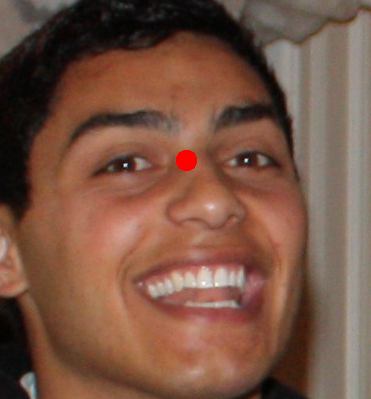

In [43]:
scaling={'bb_w': 1.3, 'bb_h': 1.4, 'c_w': 1., 'c_h': 0.1}
c = eval(record['center'])
crop_face(img, record['width'], record['height'], record['asset_width'], record['asset_height'], c[0], c[1], scaling)

In [32]:
from PIL import ImageDraw

def place_center_point(img, c_w, c_h, asset_w, asset_h):
    draw = ImageDraw.Draw(img)
    r = 10
    draw.ellipse((c_w-r, c_h-r, c_w+r, c_h+r), fill=(255, 0, 0, 0))

In [33]:
place_center_point(img, c_w, c_h, record['asset_width'], record['asset_height'])

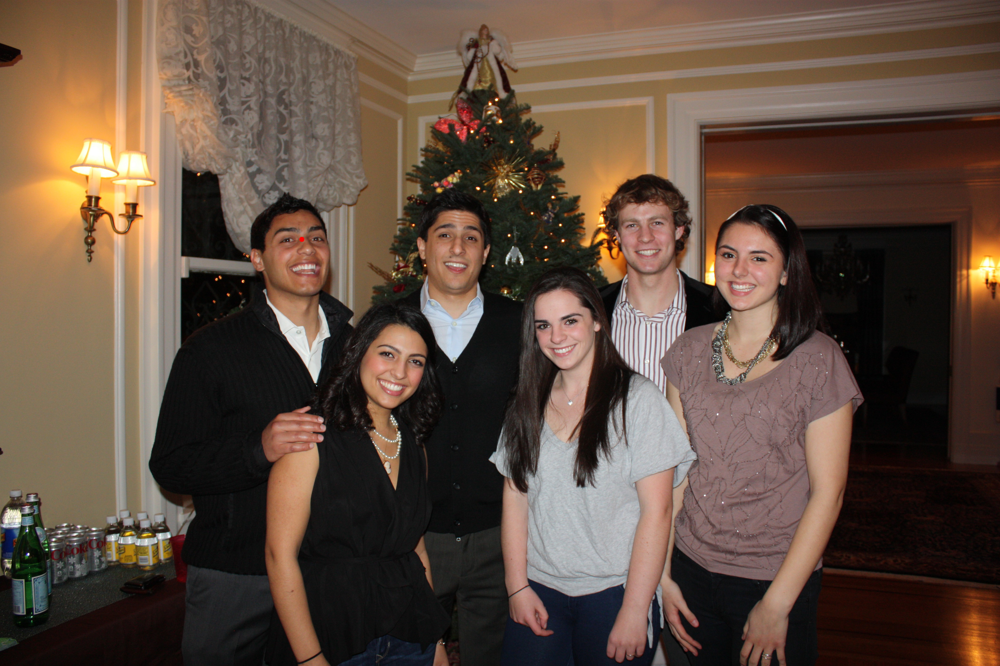

In [34]:
img

In [42]:
def crop_face(img, bb_w, bb_h, asset_w, asset_h, c_w, c_h, scaling):

    assert 'bb_w' in scaling
    assert 'bb_h' in scaling
    assert 'c_w' in scaling
    assert 'c_h' in scaling

    actual_w, actual_h = img.size

    # actual uploaded image and original asset sizes
    # may be different
    w_mult = 1.*actual_w/asset_w
    h_mult = 1.*actual_h/asset_h

    # scale the centers and bounding box dimensions
    c_w *= w_mult
    c_h *= h_mult
    bb_w *= scaling['bb_w']*w_mult
    bb_h *= scaling['bb_h']*h_mult
    c_w *= scaling['c_w']
    c_h += scaling['c_h']*bb_h
    
    

    # set bounding box coordinates
    bb = (int(c_w - bb_w/2), int(c_h - bb_h/2),
          int(c_w + bb_w/2), int(c_h + bb_h/2))

    return img.crop(bb)

In [36]:
record[['']]

memorable_id                              82851
authentication_token       eX5ZpmzZyxxv41HKXviq
width                                        40
height                                       40
asset_width                                 600
asset_height                                400
center                  (181.046875, 143.71875)
confidence                            0.5097516
captured_at                        1.293832e+09
has_original_asset                         True
fb_id                                       NaN
x_offset                                    NaN
y_offset                                    NaN
distance                                    NaN
Name: 0, dtype: object

In [52]:
path_to_img = '/Users/babasarala/Desktop/Lowres_vs_Hires/170/170_prod_1.0_low_images/75848_(241.445312, 251.296875).jpg'
img = cu.load_image(path_to_img, src='local')

In [53]:
img.size

(348, 375)